In [1]:
%matplotlib inline
%config InlineBackend.figure_formats = ['svg']
from utils import *
from yolo import *
import torch
from torch import nn
import torchvision

In [2]:
train_iter, test_iter, test_iter_raw = load_data_voc(batch_size=16, test_shuffle=False)

In [3]:
# model_weight_path = './model/resnet18-pretrained-epoch-145.pth'
model_weight_path = './model/1682382728542274100-epoch-102.pth'

resnet18 = torchvision.models.resnet18(pretrained=True)
backbone = nn.Sequential(*list(resnet18.children())[:-2]) # remove avg pool and fc
net = yolo.Yolo(backbone, backbone_out_channels=512)

net.load_state_dict(torch.load(model_weight_path))

c:\Users\Edward\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
c:\Users\Edward\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

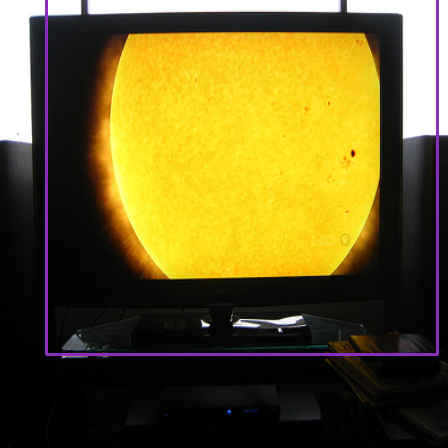

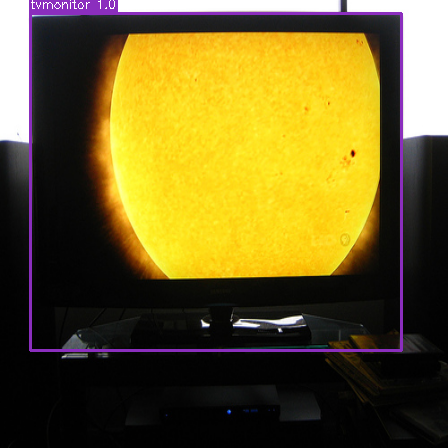

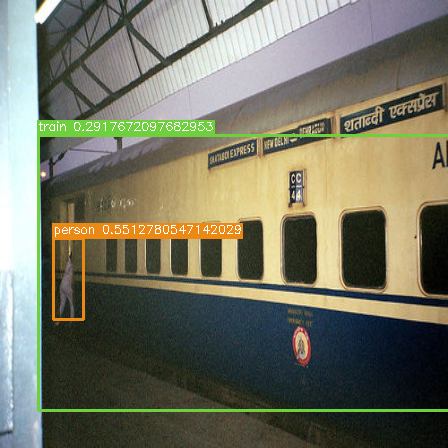

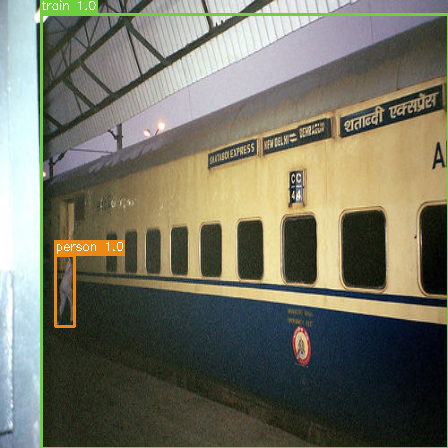

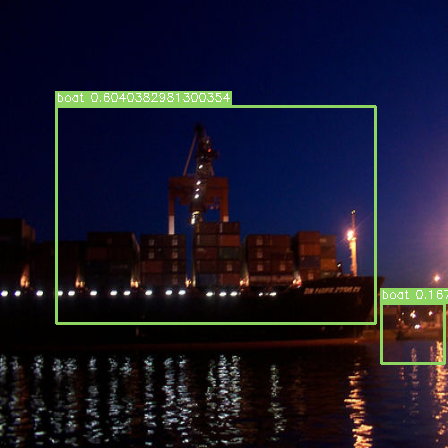

...

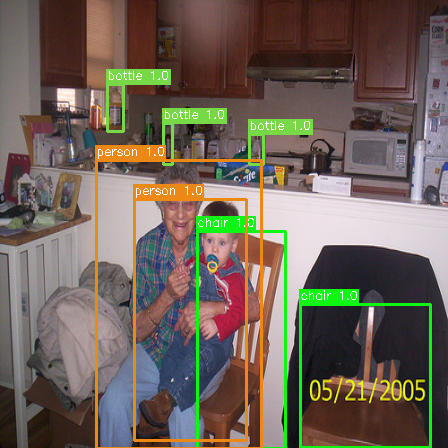

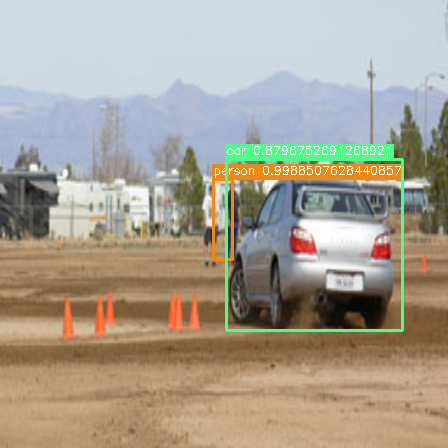

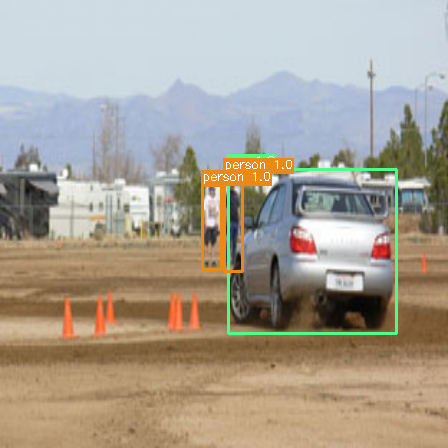

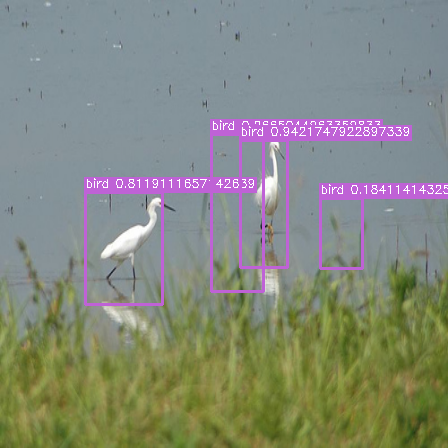

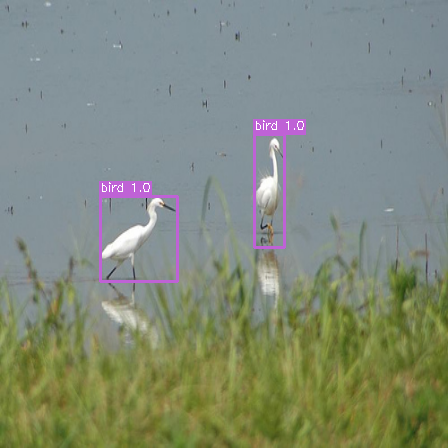

In [4]:
test_one_batch(net, test_iter_raw, 'cuda')

In [5]:
test_fps(net, test_iter_raw, 'cuda')

FPS: 94.00357337350773


Test VOC mAP: 0.4713636158879269
Test COCO mAP: 0.22784777692159683


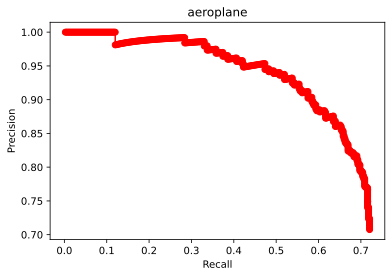

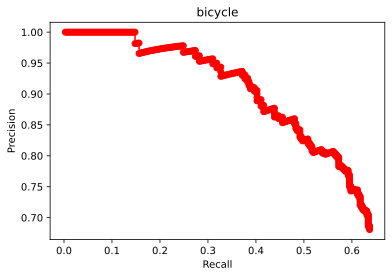

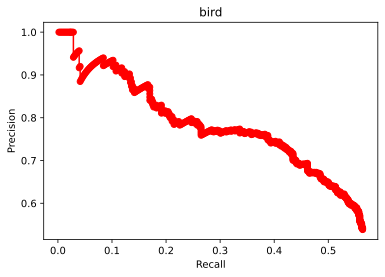

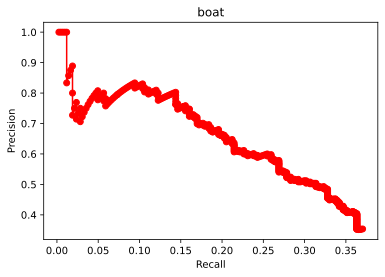

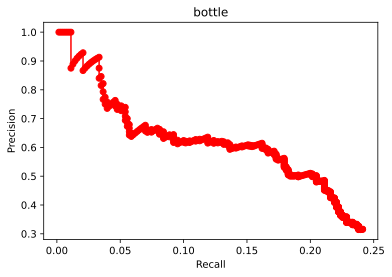

...

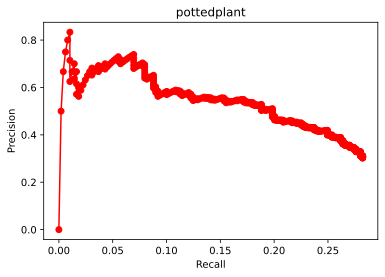

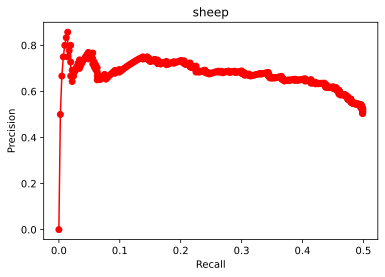

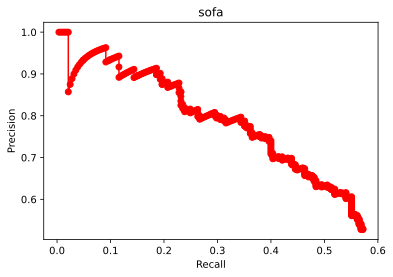

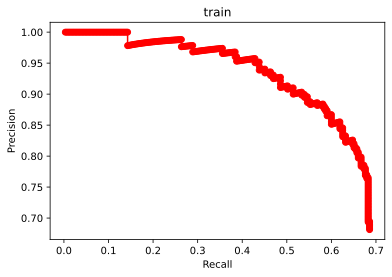

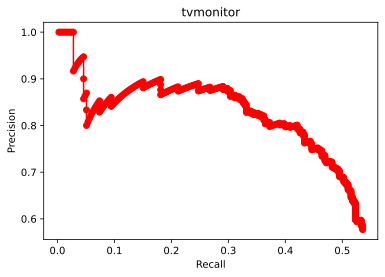

In [6]:
test_and_draw_mAP(net, test_iter_raw, 'cuda')